<a href="https://colab.research.google.com/github/TanveerAman/WeedDetection/blob/main/WeedDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 12187, done.
remote: Counting objects: 100% (63/63), done.
remote: Compressing objects: 100% (58/58), done.
remote: Total 12187 (delta 30), reused 23 (delta 5), pack-reused 12124
Receiving objects: 100% (12187/12187), 12.63 MiB | 32.18 MiB/s, done.
Resolving deltas: 100% (8380/8380), done.


In [2]:
%cd yolov5

/content/yolov5


In [3]:
%pip install -qr requirements.txt

     |████████████████████████████████| 1.6 MB 34.5 MB/s 


In [4]:
%pip install -q roboflow

     |████████████████████████████████| 145 kB 37.5 MB/s 
     |████████████████████████████████| 178 kB 68.3 MB/s 
     |████████████████████████████████| 1.1 MB 55.4 MB/s 
     |████████████████████████████████| 67 kB 7.8 MB/s 
     |████████████████████████████████| 54 kB 3.5 MB/s 
     |████████████████████████████████| 138 kB 63.3 MB/s 
     |████████████████████████████████| 62 kB 2.0 MB/s 


In [5]:
pwd

'/content/yolov5'

In [6]:
from roboflow import Roboflow

rf = Roboflow(api_key="X3GNHUxmtiTHxzTex1BQ")
project = rf.workspace("augmented-startups").project("weeds-nxe1w")
dataset = project.version(3).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Weeds-3 in yolov5pytorch:: 100%|██████████| 8418/8418 [00:01<00:00, 4377.66it/s]


In [7]:
dataset.location

'/content/yolov5/Weeds-3'

In [8]:
cd /content/yolov5

/content/yolov5


In [9]:
!python train.py --img 416 --batch 10 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Weeds-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=10, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-94-g1aea74c Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, h

In [10]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [11]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Weeds-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-94-g1aea74c Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/180 /content/yolov5/Weeds-3/test/images/20210907_153931_x264_mp4-1001_jpg.rf.10e747b443d1cd1f28967b51504cc446.jpg: 416x416 3 Weedss, 8.1ms
image 2/180 /content/yolov5/Weeds-3/test/images/20210907_153931_x264_mp4-1007_jpg.rf.c11266cd6af9ec693efd1e98ae6005c2.jpg: 416x416 1 Weeds, 8.2ms
image 3/180 /content/yolov5/Weeds-3/tes

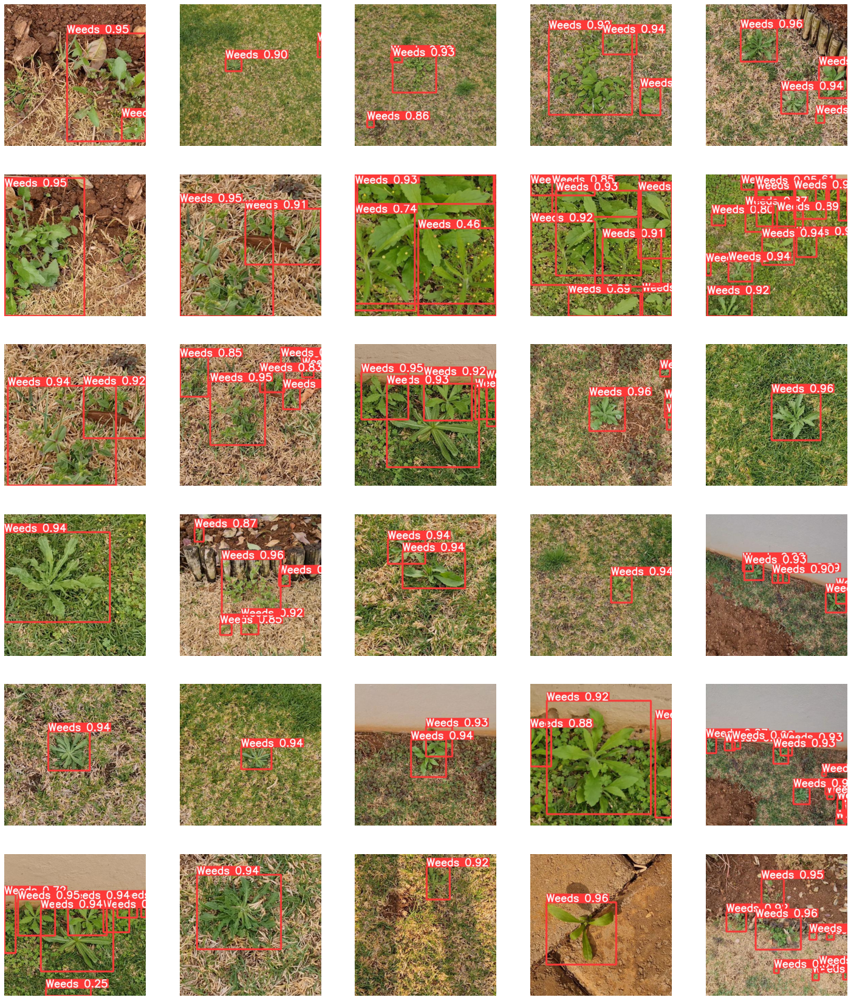

In [46]:
import glob
#import pathlib
import PIL
import matplotlib.pyplot as plt

#path = pathlib.Path("/content/yolov5/runs/detect/exp")
output = list(glob.glob('/content/yolov5/runs/detect/exp/*.jpg'))

plt.figure(figsize = (25, 30))
for i in range(30):
    plt.subplot(6, 5, i + 1)
    img = PIL.Image.open(output[i])
    plt.imshow(img)
    plt.axis(False)